# Adatvizualizáció

- Az óra célja, hogy megismerkedjünk az adatvizulaizáció fogalmával és annak használatával.
- Megtanuljuk, hogyan lehet adatokat vizualizálni a Matplotlib, Seaborn és Plotly csomagok segítségével.
- Az óra végére a hallgatók képesek lesznek egyszerű adatvizulaizációkat végrehajtani Pythonban.





### Bevezetés

Az adatvizualizáció célja
- Segít feltárni az adatok szerkezetét és mintázatait.
- Kiemeli az anomáliákat és trendeket.
- Megkönnyíti az összehasonlítást és elemzést.

Milyen grafikonokat használunk?

- Matplotlib – Alapvető ábrázolás (hisztogram, szórásdiagram, vonaldiagram)
- Seaborn – Statisztikai elemzés (boxplot, heatmap, pairplot)
- Plotly – Interaktív vizualizáció (dinamikus grafikonok)

### WINE Adatok betöltése és előkészítése

Wine Dataset – Borok kémiai jellemzői és osztályozása

A Wine dataset egy klasszikus gépi tanulási adathalmaz, amely különböző olasz borok kémiai tulajdonságait és osztályozását tartalmazza. Az adathalmaz eredetileg az UCI Machine Learning Repository-ból származik, és széles körben használják adatfeldolgozási és vizualizációs gyakorlatokhoz.

Az adathalmaz jellemzői

- Forrás: Scikit-learn beépített dataset, eredetileg az UCI Machine Learning Repository
- Mérete: 178 minta, 13 numerikus jellemző
- Célváltozó: 3 különböző borfajta (Class 0, 1, 2)
- Felhasználási terület: Osztályozási problémák, statisztikai elemzés, adatvizualizáció


Az adathalmaz oszlopai
- alcohol	= Alkohol tartalom
- malic_acid = Almasav mennyisége
- ash	= Hamu tartalom
- alcalinity_of_ash =	Hamu lúgossága
- magnesium	= Magnézium mennyisége
- total_phenols =	Teljes fenoltartalom
- flavanoids = Flavonoidok mennyisége
- nonflavanoid_phenols = Nem flavonoid fenolok mennyisége
- proanthocyanins =	Proantocianidinek mennyisége
- color_intensity =	Színintenzitás
- hue	= Árnyalat
- od280/od315_of_diluted_wines = Hígított bor optikai sűrűsége
- proline	= Prolin aminosav tartalom



In [4]:
from sklearn.datasets import load_wine
import pandas as pd

# Adatok betöltése
wine = load_wine()

# A wine.data egy Numpy tömb, amelyet Pandas DataFrame-mé alakítunk.
# Az oszlopnevekhez a wine.feature_names listát használjuk, hogy érthető 
# legyen, melyik szám melyik jellemzőt takarja.
df = pd.DataFrame(wine.data, columns=wine.feature_names)

# A célváltozót (target) is hozzárendeljük a táblázathoz,
# így minden mintáról tudjuk, melyik bortípusba tartozik.
df["target"] = wine.target  # A célváltozó (bor típusa)

# Adatok első 5 sorának megtekintése
display(df.head())


,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,0


Mit csinálunk itt?

- Scikit-learnből betöltjük a Wine datasetet.
- DataFrame-be alakítjuk, és hozzáadjuk a célváltozót (target).
- Az első 5 sort kiírjuk, hogy lássuk az adatokat.


### Alapvető vizualizációk Matplotlib segítségével

A Matplotlib egy alapvető vizualizációs könyvtár, amelyet széles körben használnak hisztogramok, vonaldiagramok és szórásdiagramok készítésére.

Bővebben: [katt ide](https://matplotlib.org/)

## Hisztogram – Alkohol tartalom eloszlása

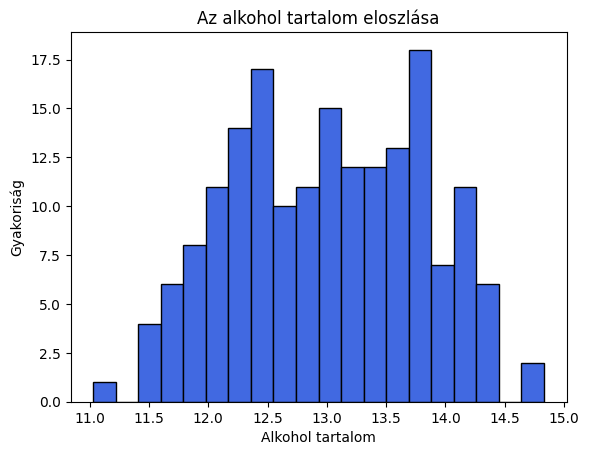

In [8]:
import matplotlib.pyplot as plt # Az adatok vizualizációjához a matplotlib könyvtárat használjuk.

# A hisztogram az eloszlást mutatja meg: azt, hogy különböző 
# értéktartományokban (ún. "bin"-ekben) hány minta található.
# bins=20 -> 20 oszlopra bontjuk fel az értékeket, így részletesebb képet kapunk.
# color és edgecolor -> az oszlopok színét és szegélyét állítjuk be
plt.hist(df["alcohol"], bins=20, color="royalblue", edgecolor="black")

# A tengelyek feliratai segítenek megérteni, hogy mit ábrázol az ábra.
plt.xlabel("Alkohol tartalom")
plt.ylabel("Gyakoriság")

# Címet is adunk a grafikonnak, hogy rögtön világos legyen, mit látunk.
plt.title("Az alkohol tartalom eloszlása")

# Végül a plt.show() hívás jeleníti meg a diagramot a képernyőn.
plt.show()

Mit csinálunk?

- Az alkohol tartalom eloszlását mutatjuk meg hisztogramon.
- 20 osztályközre bontjuk az adatokat.

Mit mutat a hisztogram, és mi a jelentősége?

A hisztogram egy eloszlásdiagram, amely megmutatja, hogy egy numerikus változó milyen gyakorisággal fordul elő az adathalmazban. Az értékeket osztályközökbe (bin-ekbe) sorolja, és minden osztályköz felett egy oszlop mutatja meg az adott tartományba eső elemek számát.

Hogyan működik a hisztogram?

- Az X-tengely az adatok tartományát mutatja (pl. alkohol szint egy bor datasetben).
- Az Y-tengely az adott értéktartományba eső adatpontok gyakoriságát jelzi.
- Az adatok csoportosítva vannak bin-ekbe (osztályközökbe).

### Szórásdiagram – Alkohol és flavonoidok kapcsolata


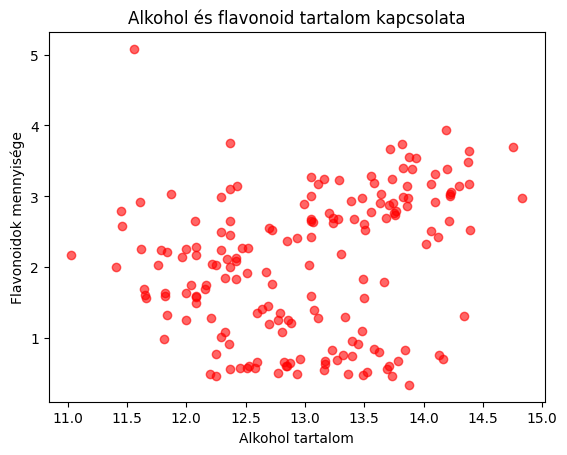

In [12]:
# A szórásdiagram (scatter plot) két numerikus változó közötti kapcsolatot ábrázolja.

# color="red" -> a pontokat piros színnel rajzoljuk.
# alpha=0.6 -> az átlátszóság beállítása (0=átlátszó, 1=teljesen fedő)
plt.scatter(df["alcohol"], df["flavanoids"], color="red", alpha=0.6)

# Tengelyek feliratai a változók értelmezéséhez
plt.xlabel("Alkohol tartalom")
plt.ylabel("Flavonoidok mennyisége")

# Cím a grafikonhoz, hogy egyértelmű legyen mit ábrázolunk
plt.title("Alkohol és flavonoid tartalom kapcsolata")

# Az ábra megjelenítése
plt.show()

Mit csinálunk?

- Megvizsgáljuk, hogy van-e kapcsolat az alkohol- és flavonoidtartalom között.
- Szórásdiagramon ábrázoljuk a kapcsolatot.

### Statisztikai vizualizációk Seaborn segítségével
A Seaborn a Matplotlibre épülő vizualizációs könyvtár, amely segít statisztikai elemzéseket és adatfeltárást végezni.

### Boxplot – Az alkohol tartalom eloszlása borfajtánként

Mit mutat a boxplot, és mire jó?

A boxplot (dobozdiagram) egy statisztikai ábra, amely egy változó eloszlását, szórását és kiugró értékeit mutatja meg. A hisztogrammal ellentétben a boxplot összefoglaló statisztikai információt ad egy adott oszlopról, és kiemeli a kiugró értékeket is.

Hogyan épül fel egy boxplot?

A boxplot öt kulcsfontosságú értéket jelenít meg:
- Minimum (alsó határ, de nem outlierek)
- Alsó kvartilis (Q1 – 25%)
-  Medián (Q2 – 50%)
-  Felső kvartilis (Q3 – 75%)
-  Maximum (felső határ, de nem outlierek)
-  Kiugró értékek (outlierek) – a diagramon általában külön pontokként jelennek meg.

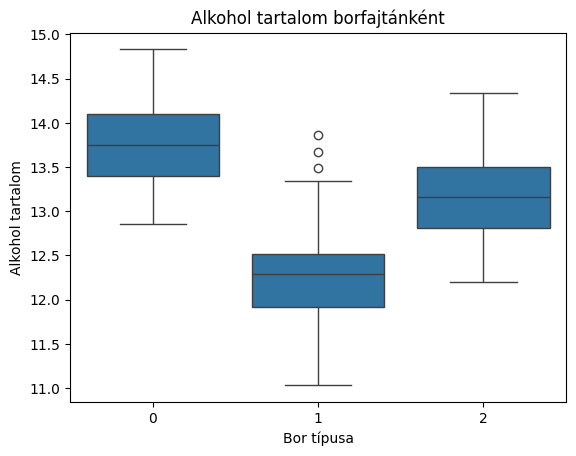

In [17]:
import seaborn as sns

sns.boxplot(x="target", y="alcohol", data=df)
plt.xlabel("Bor típusa")
plt.ylabel("Alkohol tartalom")
plt.title("Alkohol tartalom borfajtánként")
plt.show()


Mit csinálunk?

- Boxplot segítségével megnézzük, hogyan oszlik el az alkohol tartalom a különböző borok között.
- A target oszlop megmutatja a különböző borfajtákat.

Mit mutat ez az ábra?

- Minden egyes borfajta (target) kap egy saját dobozt.
- A doboz közepe a medián értéket (Q2) mutatja.
- A doboz alja és teteje az alsó (Q1) és felső (Q3) kvartilist jelzi.
- A vízszintes vonalak ("bajuszok") a minimális és maximális értékeket mutatják (kiugrók nélkül).
- A különálló pontok a kiugró értékeket jelölik.

Miért hasznos a boxplot az adatelemzésben?

- Kimutatja az eloszlás szerkezetét – könnyen látható a szimmetria vagy ferdeség.
- Segít az outlierek azonosításában – kiugró értékek kiszűrésére hasznos.
- Megmutatja a szórást és az adatok terjedelmét – látható, mennyire változó egy adott változó értéke.
- Könnyű összehasonlítani különböző kategóriák között – például különböző borfajták alkohol tartalmát.

### Standard Deviáció (STD) és Kovariancia

A szórás (standard deviation, STD) és a kovariancia két alapvető statisztikai mérőszám, amelyeket gyakran használunk az adatok változékonyságának és a változók közötti kapcsolat erősségének vizsgálatára.

## Standard Deviáció (STD) – Mit jelent?

- A standard deviáció (szórás) egy numerikus változó szétszórtságát méri az átlag körül.
- Ha egy adathalmaz szórása nagy, az azt jelenti, hogy az adatok nagyon eltérnek az átlagtól.
- Ha a szórás kicsi, akkor az értékek szorosan az átlag körül helyezkednek el.

🔹 Formula (STD):

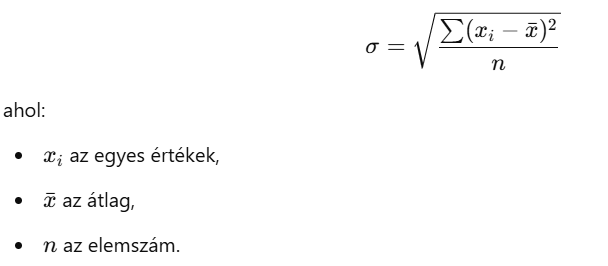

Példa: Alkohol tartalom szórása a Wine Dataset-en

In [24]:
# Szórás kiszámítása
std_alcohol = df["alcohol"].std()
print(f"Alkohol tartalom szórása: {std_alcohol:.2f}")


Alkohol tartalom szórása: 0.81


Mit látunk?

- A szórás megmutatja, hogy az alkoholtartalom mennyire ingadozik a borok között.
- Ha nagy az érték, akkor nagyon különböző alkoholtartalmú borok vannak az adathalmazban.



### Kovariancia – Mit jelent?
A kovariancia két numerikus változó közötti kapcsolat erősségét és irányát méri.

- Ha a kovariancia pozitív, akkor amikor az egyik változó nő, a másik is nő.
- Ha negatív, akkor az egyik változó növekedése a másik csökkenésével jár.
- Ha nulla, akkor nincs kapcsolat a két változó között.

🔹 Formula (Kovariancia):
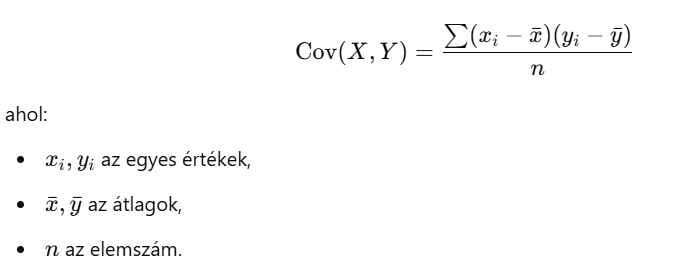

Példa: Alkohol és színintenzitás kovarianciája



In [28]:
# Kovariancia kiszámítása
cov_matrix = df[["alcohol", "color_intensity"]].cov()
print("Kovariancia mátrix:")
print(cov_matrix)


Kovariancia mátrix:
                  alcohol  color_intensity
alcohol          0.659062         1.028283
color_intensity  1.028283         5.374449


Mit látunk?

- A mátrixban az alcohol és color_intensity közötti érték mutatja, hogy van-e kapcsolat közöttük.
- Ha az érték pozitív és nagy, akkor az alkohol és a színintenzitás egy irányban változik.
- Ha az érték közel van 0-hoz, akkor nincs erős kapcsolat.

A Scatter plott segit

- Ha a pontok felfelé haladnak egy vonal mentén, az erős pozitív kapcsolatot jelez.
- Ha szétszórtak, akkor a kovariancia kicsi, és nincs erős kapcsolat.

1. Az átlóban lévő értékek (variancia)
   
- alcohol -> 0.659
    - Ez az alkoholtartalom varianciája (mennyire szóródik az alkoholtartalom a minták között).

- color_intensity -> 5.374
    - Ez a színintenzitás varianciája, látszik, hogy sokkal nagyobb a szórás, mint az alkoholnál.

2. Az átlón kívüli értékek (kovariancia)

- alcohol és color_intensity -> 1.028
    - Ez azt mutatja, hogy pozitív kapcsolat van a két változó között: amikor az alkoholtartalom nagyobb, akkor általában a színintenzitás is magasabb.

3. Fontos tudnivaló

- A kovariancia nincs normalizálva. Az érték nagysága függ az adatok mértékegységétől.
    - Ezért önmagában nem könnyű megmondani, mennyire erős a kapcsolat.


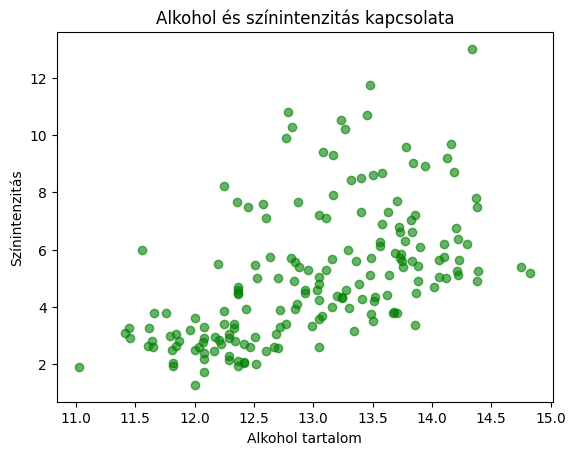

In [31]:
# Szórásdiagram készítése az alkohol és színintenzitás kapcsolatáról
plt.scatter(df["alcohol"], df["color_intensity"], color="green", alpha=0.6)

plt.xlabel("Alkohol tartalom")
plt.ylabel("Színintenzitás")
plt.title("Alkohol és színintenzitás kapcsolata")

plt.show()


### Többváltozós Scatterplot készítése (x, y, szín, alak)

A scatterplot az egyik legjobb eszköz több változó együttes vizsgálatára, mivel egyszerre megjeleníthetünk numerikus és kategóriás adatokat is az alábbi módokon:

- X-tengely -> Egy numerikus változó (pl. alkohol tartalom)
- Y-tengely -> Másik numerikus változó (pl. flavonoidok mennyisége)
- Szín (color) -> Kategóriás változó (pl. bor típusa)
- Alak (marker vagy style) -> Egy másik kategóriás változó vagy numerikus csoport

Példa: Vizsgáljuk meg az alkohol tartalom, flavonoid tartalom, színintenzitás és borfajta közötti kapcsolatot egy 4D scatterploton!

Vizsgáljuk az alábbi változókat:

- X-tengely: alcohol (Alkohol tartalom)
- Y-tengely: color_intensity
- Szín: flavanoids 

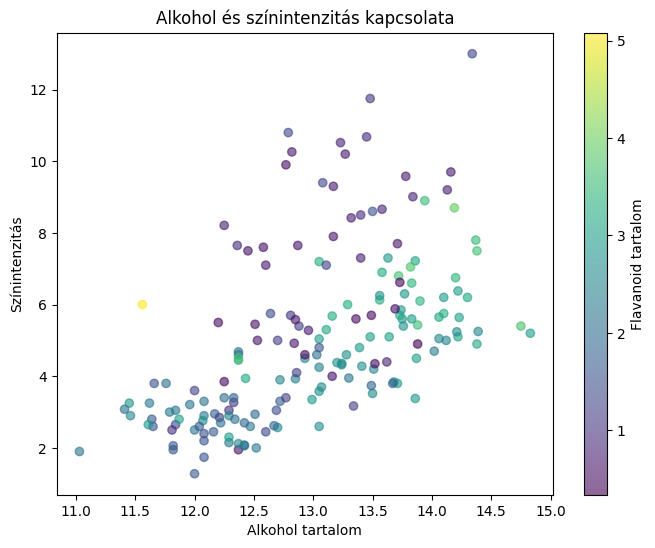

In [34]:
# Szórásdiagram készítése az alkohol és színintenzitás kapcsolatáról
# Szórásdiagram készítése
plt.figure(figsize=(8,6))
scatter = plt.scatter(
                        df["alcohol"], 
                        df["color_intensity"], 
                        c=df['flavanoids'],      # use 'c' for continuous color
                        cmap='viridis',           # színskála
                        alpha=0.6
                    )

plt.xlabel("Alkohol tartalom")
plt.ylabel("Színintenzitás")
plt.title("Alkohol és színintenzitás kapcsolata")

# Színskála hozzáadása
cbar = plt.colorbar(scatter)
cbar.set_label('Flavanoid tartalom')

plt.show()


A szórásdiagrammon akár marker-eket is tudunk használni. Azonban fontos megjegyezni, hogy a MARKER-nek használt oszlopnak kategorikus válzotónak kell lennie, hiszen ennélkül végtelen számú markert kellene definiálni.

Vizsgáljuk az alábbi változókat:

- X-tengely: alcohol (Alkohol tartalom)
- Y-tengely: color_intensity
- Szín: flavanoids 
- Marker stílus: bor típusa (kategorizált adat)

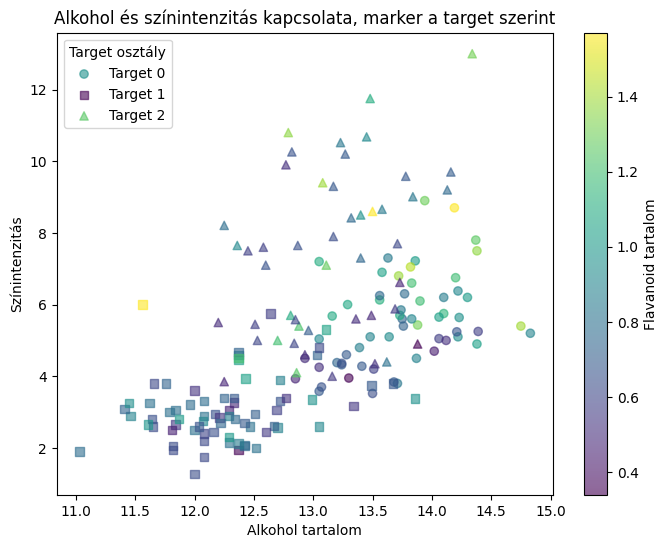

In [36]:
# --- Marker típusok definiálása a target osztályokhoz ---
# 'o' = kör, 's' = négyzet, '^' = háromszög
markers = ['o', 's', '^']  

# --- Ábra méretének beállítása ---
plt.figure(figsize=(8,6))

# scatter változó, amire később a colorbar-t fogjuk csatolni
scatter = None

# --- Scatter plot létrehozása osztályonként ---
for i, target_class in enumerate(df['target'].unique()):
    # Kiválasztjuk az adott target osztályhoz tartozó sorokat
    subset = df[df['target'] == target_class]
    
    # Scatter plot készítése
    scatter = plt.scatter(
        subset["alcohol"],            # X tengely: alkohol tartalom
        subset["color_intensity"],    # Y tengely: színintenzitás
        c=subset['flavanoids'],       # Szín: flavanoid tartalom
        cmap='viridis',               # Színskála a folyamatos értékekhez
        alpha=0.6,                    # Átlátszóság, hogy a pontok átfedése látszódjon
        marker=markers[i],            # Marker forma az osztály szerint
        label=f'Target {target_class}' # Jelmagyarázat címke
    )

# --- Tengelyek címkézése ---
plt.xlabel("Alkohol tartalom")
plt.ylabel("Színintenzitás")

# --- Ábra címe ---
plt.title("Alkohol és színintenzitás kapcsolata, marker a target szerint")

# --- Jelmagyarázat megjelenítése ---
plt.legend(title='Target osztály')

# --- Színskála (colorbar) hozzáadása az utolsó scatter-hez ---
cbar = plt.colorbar(scatter)
cbar.set_label('Flavanoid tartalom')  # Colorbar címkéje

# --- Ábra megjelenítése ---
plt.show()



MI történik akkor ha a változónk nem kategorikus? Ilyenkor például bin-ekbe rakhatjuk az értékünket és ezzel már kategóriákat készitettünk.

In [38]:
# --- Saját bin-ek definiálása ---
# Példa intervallumok (magnesium értékek szerint)
bin_edges = [0, 70, 80, 90, 100]             # itt a számok a magnesium értékeket jelzik
bin_labels = ['Alacsony', 'Közepes', 'Magas', 'Nagyon magas']  # mi adjuk a neveket

# Bin oszlop létrehozása a pandas.cut segítségével
df['magnesium_bin'] = pd.cut(df['magnesium'], bins=bin_edges, labels=bin_labels)

<Figure size 800x600 with 0 Axes>

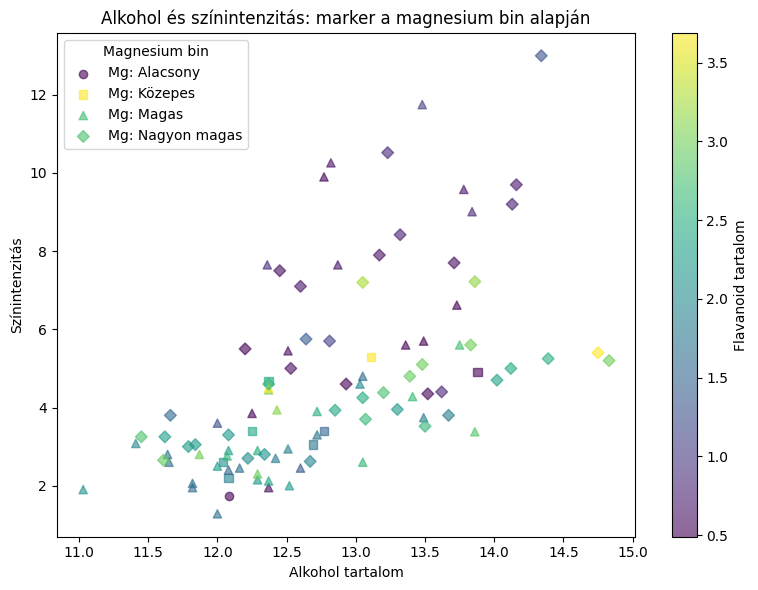

In [39]:
# Marker típusok a bin-ekhez
markers = ['o', 's', '^', 'D']  # kör, négyzet, háromszög, rombusz

plt.figure(figsize=(8,6))
scatter = None

# Marker típusok a bin-ekhez
markers = ['o', 's', '^', 'D']  # kör, négyzet, háromszög, rombusz

plt.figure(figsize=(8,6))
scatter = None

# --- Scatter plot bin-ek szerint ---
for bin_label, marker in zip(bin_labels, markers):
    subset = df[df['magnesium_bin'] == bin_label]
    if len(subset) == 0:
        continue
    scatter = plt.scatter(
        subset['alcohol'],
        subset['color_intensity'],
        c=subset['flavanoids'],  # szín a flavanoid értékek szerint
        cmap='viridis',
        alpha=0.6,
        marker=marker,
        label=f'Mg: {bin_label}'
    )

plt.xlabel("Alkohol tartalom")
plt.ylabel("Színintenzitás")
plt.title("Alkohol és színintenzitás: marker a magnesium bin alapján")
plt.legend(title='Magnesium bin')

# Színskála
cbar = plt.colorbar(scatter)
cbar.set_label('Flavanoid tartalom')

plt.tight_layout()
plt.show()


In [40]:
# dobjuk el a 'magnesium_bin' oszlopot
df = df.drop(columns = ['magnesium_bin'])

## Korreláció (Correlation) - Mit jelent?

A korreláció a kovarianciát **normalizálja**, hogy értéke mindig \([-1, 1]\) tartományba essen.  
Leggyakrabban a **Pearson-féle korreláció** használatos.

**Képlete:**
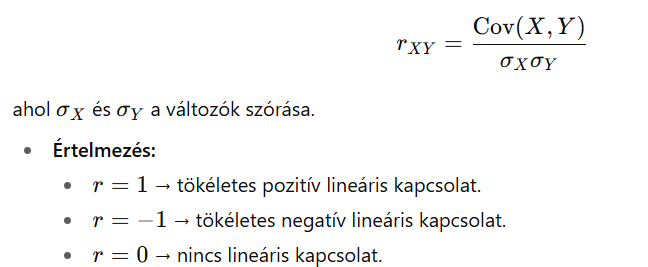

**Előny:** Mivel normalizált, könnyen összehasonlítható különböző változók között.

## Pearson vs Spearman korreláció

### Pearson
- Mér **lineáris kapcsolatot** két folyamatos numerikus változó között.
- Feltételek:
  - Folyamatos adatok
  - Lineáris kapcsolat
  - Normális eloszlás (nagy mintán nem kritikus)
- Érték: -1 → tökéletes negatív, 1 → tökéletes pozitív, 0 → nincs lineáris kapcsolat
- **Használat:** pl. testsúly és magasság, hőmérséklet és energiafogyasztás

### Spearman
- Mér **monoton kapcsolatot** a változók rangjai alapján.
- Feltételek:
  - Rangskálás vagy numerikus adatok
  - Robusztus kiugrók esetén is
- Érték: -1 → fordított monoton, 1 → pozitív monoton, 0 → nincs monoton kapcsolat
- **Használat:** pl. iskolai rangsor és fizetés, nem lineáris, de monoton kapcsolatok (Nem lineáris lehet: az 1–5. helyezett közti fizetés különbség nagyobb lehet, míg a 20–25. helyezettek között kicsi.)


### Korrelációs heatmap

A korrelációs heatmap (hőtérkép) egy vizualizációs eszköz, amely két vagy több numerikus változó közötti kapcsolatot szemlélteti egy színezett mátrix formájában. Az egyes változók közötti korrelációs együtthatót (-1 és 1 között) ábrázolja, ahol a színek intenzitása segít gyorsan felismerni az összefüggéseket.


Hogyan értelmezzük a (Pearson) korrelációt?

- +1 (pozitív korreláció) -> A két változó együtt növekszik vagy csökken. (Pl. több flavonoid -> magasabb színintenzitás)
- 0 (nincs korreláció) -> A változók függetlenek egymástól.
- -1 (negatív korreláció) -> Az egyik változó növekszik, a másik csökken. (Pl. több savtartalom -> alacsonyabb cukorszint)

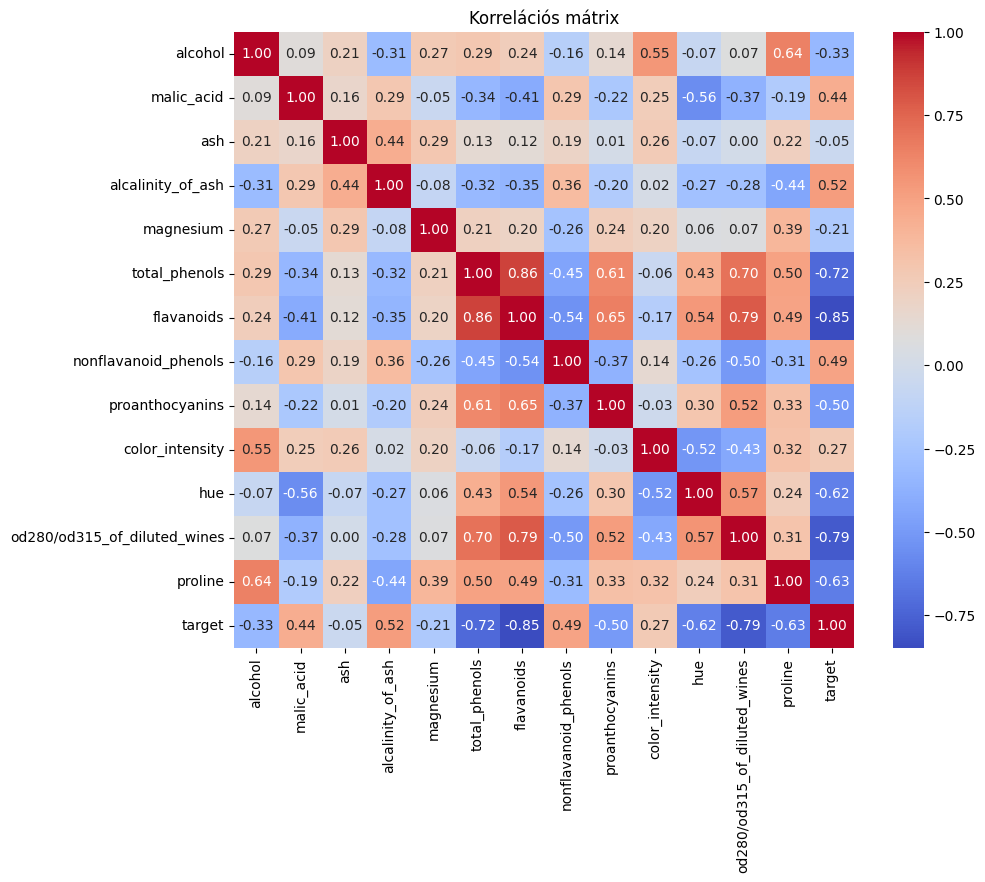

In [45]:
# A seaborn könyvtár segítségével hőtérképet készítünk a korrelációs mátrixról.
import seaborn as sns

plt.figure(figsize=(10, 8))  # Ábra méretének beállítása

# sns.heatmap(...) -> a hőtérkép:
#   - df.corr(): a DataFrame korrelációs mátrixa
#   - annot=True: kiírja a számértékeket is a cellákba
#   - cmap="coolwarm": a színek skálája (kék = negatív kapcsolat, piros = pozitív kapcsolat)
#   - fmt=".2f": két tizedesjegyre kerekíti a számokat
sns.heatmap(df.corr(), annot=True, cmap="coolwarm", fmt=".2f")

plt.title("Korrelációs mátrix")
plt.show()


Miért hasznos a korrelációs heatmap?
- Segít az összefüggések gyors felismerésében – láthatjuk, mely változók kapcsolódnak egymáshoz.
- Felfedi az erős és gyenge korrelációkat – segít a megfelelő változók kiválasztásában.
- Hasznos a gépi tanulás előtt – ha két változó nagyon erősen korrelál (> 0.9), az egyik elhagyható a modellből.
- Anomáliák vagy váratlan összefüggések feltárása – például egyes borjellemzők szoros kapcsolatban lehetnek az alkoholtartalommal.

Mit keresünk egy heatmap elemzésekor?
- Erős korrelációt mutató változókat – ezek közvetlen kapcsolatban állhatnak egymással.
- Gyenge vagy nulla korrelációt – ezek független tényezők lehetnek.
- Váratlan összefüggéseket – például egy magas prolin érték összefügghet a bor édességével.

Használható-e a korreláció feature selection-re?

Igen! A korrelációs elemzés egy egyszerű és hatékony módszer a feature selection-re, azaz a legfontosabb változók kiválasztására egy gépi tanulási modell számára. Az erősen korreláló változók eltávolítása javíthatja a modell teljesítményét és csökkentheti a számítási költségeket.

Hogyan használhatjuk a korrelációt feature selection-re?

- Túl erősen korreláló változók kiszűrése
- Ha két jellemző nagyon hasonló információt hordoz (|corr| > 0.9), akkor az egyik eltávolítható.
Például, ha az alcohol és proline változók között nagyon erős korreláció van, az egyik elhagyható.
- Gyengén korreláló változók figyelmen kívül hagyása
Ha egy feature nem mutat kapcsolatot a célváltozóval (|corr| < 0.1), akkor lehet, hogy nem releváns a modell számára.
- Célváltozóhoz való korreláció vizsgálata

Megnézzük, hogy mely feature-ök mutatnak erős kapcsolatot a célváltozóval, és azokat tartjuk meg.



### Interaktív vizualizációk Plotly segítségével

A Plotly egy interaktív vizualizációs könyvtár, amely lehetővé teszi az adatok dinamikus vizsgálatát.

In [50]:
import plotly.express as px

fig = px.scatter(df, x="alcohol", y="flavanoids", color="target",
                 title="Alkohol és flavonoid tartalom interaktív vizsgálata")
fig.show()


Mit csinálunk?

- Interaktív szórásdiagramot hozunk létre.
- A bor típusa különböző színekkel jelenik meg.


Mit látunk?

- Az X és Y tengelyen numerikus változók (alkohol és flavonoid tartalom) szerepelnek.
- A színek a bor típusait jelölik (target).
- A pontok alakja a színintenzitást jelzi (color_intensity).

### Interaktív többváltozós scatterplot Plotly segítségével

Ha interaktív ábrát szeretnénk, használhatjuk a Plotly könyvtárat:

In [54]:
import plotly.express as px

# Színintenzitást kategorizáljuk (alacsony/közepes/magas)
df["color_group"] = pd.qcut(df["color_intensity"], q=3, labels=["Alacsony", "Közepes", "Magas"])

fig = px.scatter(
    df,
    x="alcohol",
    y="flavanoids",
    color="target",
    symbol="color_group",
    size="hue",  # Árnyalat hozzáadása méretként
    hover_data=["proline"],  # Plusz információ megjelenítése hoverre
    title="Alkohol, flavonoid és színintenzitás összefüggése"
)

fig.show()


Mit tudunk ezzel az ábrával?

- Interaktív módon zoomolhatunk és hover információt kapunk.
- A méret (size) most az árnyalat (hue) értékével változik.
- A szín és az alak egyszerre mutatja a kategóriákat.

Miért hasznos a többdimenziós scatterplot?
- Egyszerre több változó kapcsolatát láthatjuk.
- Vizsgálható, hogy a kategóriák hogyan különülnek el (pl. különböző borfajták).
- Interaktív verzióval még könnyebb az adatfeltárás.

Ez egy nagyon hasznos vizualizációs eszköz komplex adatok elemzésére!

### KDE (Kernel Density Estimation) és Density Plot

A KDE (Kernel Density Estimation) plot, más néven sűrűségfüggvény-grafikon, egy simított verziója a hisztogramnak. Ahelyett, hogy az adatokat oszlopokba rendezné (mint a hisztogram), egy folytonos görbét rajzol, amely a valószínűségi eloszlást modellezi.

Miért hasznos a KDE plot?
- Folytonos sűrűségbecslést ad, így pontosabb képet mutat az eloszlásról.
- Nincs bin méret-probléma -> a hisztogramnál a bin méretének megválasztása torzíthatja az ábrát.
- Egymásra rajzolható -> több változó eloszlását is összehasonlíthatjuk.
- Segít az outlierek és multimodális eloszlások azonosításában (ha az adatoknak több csúcsa van).

### KDE plot készítése Seaborn segítségével

Vizsgáljuk az alcohol változó sűrűségeloszlását!

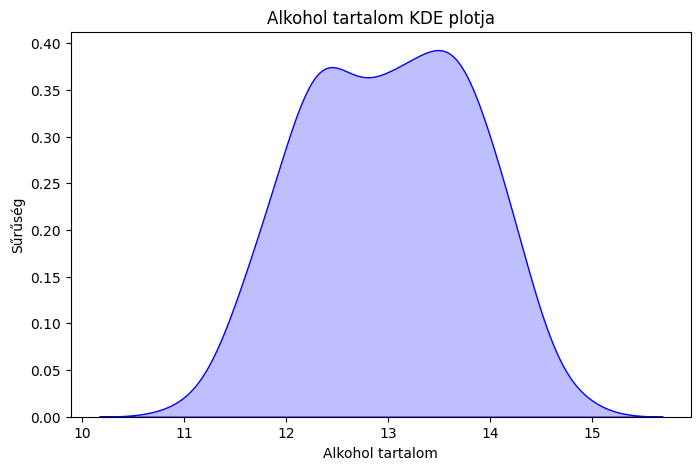

In [59]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
sns.kdeplot(df["alcohol"], fill=True, color="blue")
plt.xlabel("Alkohol tartalom")
plt.ylabel("Sűrűség")
plt.title("Alkohol tartalom KDE plotja")
plt.show()


Mit látunk?

- A görbe csúcsa mutatja, hogy hol vannak az adatok többsége.
- A sűrűség területe nagyobb ott, ahol több adatpont van.
- Jobban látszik az eloszlás formája, mint egy hisztogramnál.

### Több változó KDE plotja összehasonlítás céljából

Nézzük meg az alcohol eloszlását borfajtánként (target)!

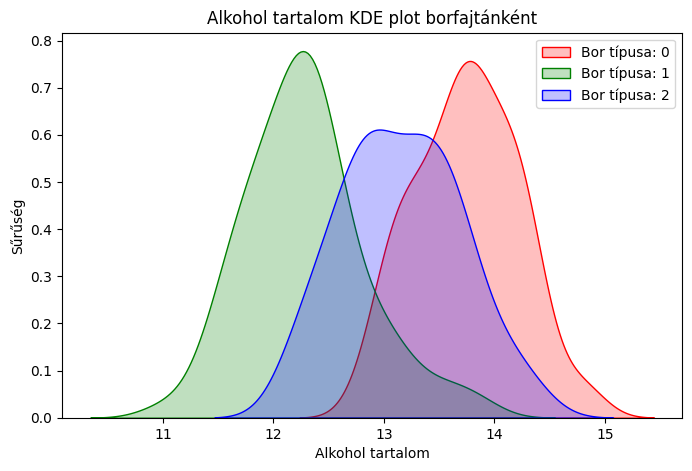

In [62]:
plt.figure(figsize=(8, 5))
sns.kdeplot(df[df["target"] == 0]["alcohol"], fill=True, label="Bor típusa: 0", color="red")
sns.kdeplot(df[df["target"] == 1]["alcohol"], fill=True, label="Bor típusa: 1", color="green")
sns.kdeplot(df[df["target"] == 2]["alcohol"], fill=True, label="Bor típusa: 2", color="blue")
plt.xlabel("Alkohol tartalom")
plt.ylabel("Sűrűség")
plt.title("Alkohol tartalom KDE plot borfajtánként")
plt.legend()
plt.show()


Mit látunk?

- A három különböző borfajta eloszlása eltér -> segíthet megérteni az egyes osztályok különbségeit.
- Az egyik csúcs magasabban lehet, ami azt jelzi, hogy az adott borfajta gyakrabban tartalmaz egy bizonyos alkoholszintet.
- Ha a görbék átfednek, az azt jelenti, hogy a borok alkoholtartalma nem különbözteti meg teljesen az osztályokat.

### KDE és Hisztogram kombinálása

Megmutatja az eloszlás alakját és az adatpontok számát is:

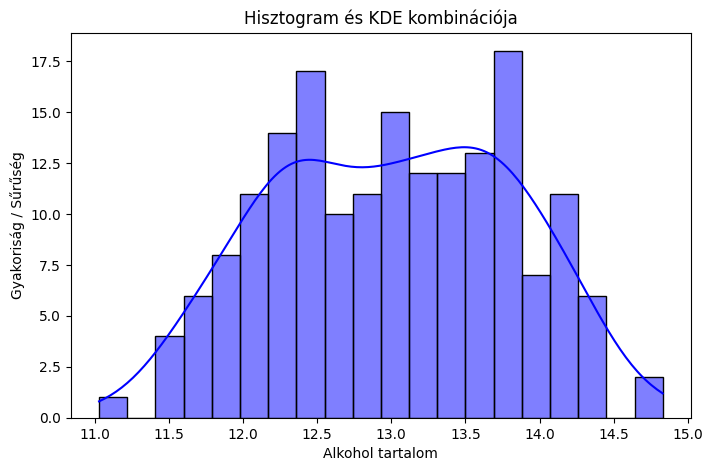

In [65]:
plt.figure(figsize=(8, 5))
sns.histplot(df["alcohol"], kde=True, bins=20, color="blue")
plt.xlabel("Alkohol tartalom")
plt.ylabel("Gyakoriság / Sűrűség")
plt.title("Hisztogram és KDE kombinációja")
plt.show()


Miért jó ez?

- A hisztogram konkrét oszlopokat ad, így könnyen számolható, hány adat esik egy-egy intervallumba.
- A KDE simább görbét ad, így jobban látszik az eloszlás szerkezete.
- Együtt használva részletesebb képet kapunk az adatok eloszlásáról.

### Kétváltozós KDE plot (Bivariate KDE) – Alkohol és Flavonoidok

Cél: Megmutatja az alcohol és flavanoids változók közötti eloszlást és sűrűséget.

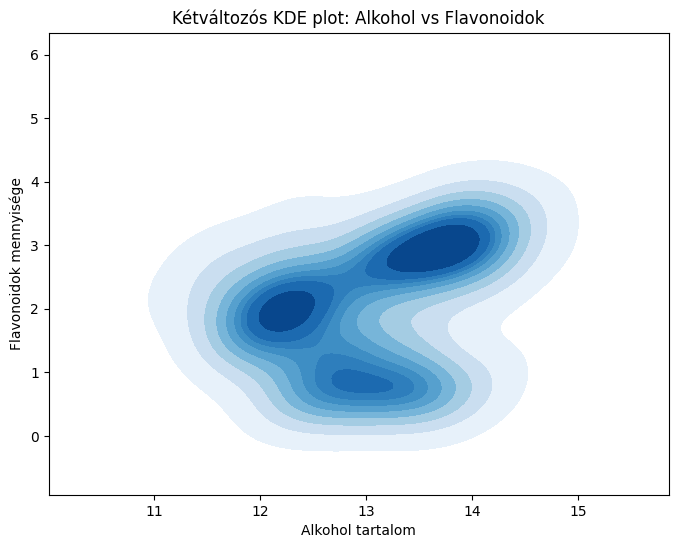

In [68]:
plt.figure(figsize=(8, 6))
sns.kdeplot(x=df["alcohol"], y=df["flavanoids"], cmap="Blues", fill=True)
plt.xlabel("Alkohol tartalom")
plt.ylabel("Flavonoidok mennyisége")
plt.title("Kétváltozós KDE plot: Alkohol vs Flavonoidok")
plt.show()


Mit látunk?

- A kék színek intenzitása mutatja, hogy hol vannak a legsűrűbb adatok.
- Ahol a legsötétebb a terület, ott a legtöbb adatpont található.
- Ha a pontok koncentrálódnak, az azt jelenti, hogy a két változó között erős kapcsolat lehet.

### KDE kontúrvonalak – Alkohol és Színintenzitás

Cél: Megmutatja, hogyan kapcsolódik egymáshoz két numerikus változó, de kontúrvonalakkal.

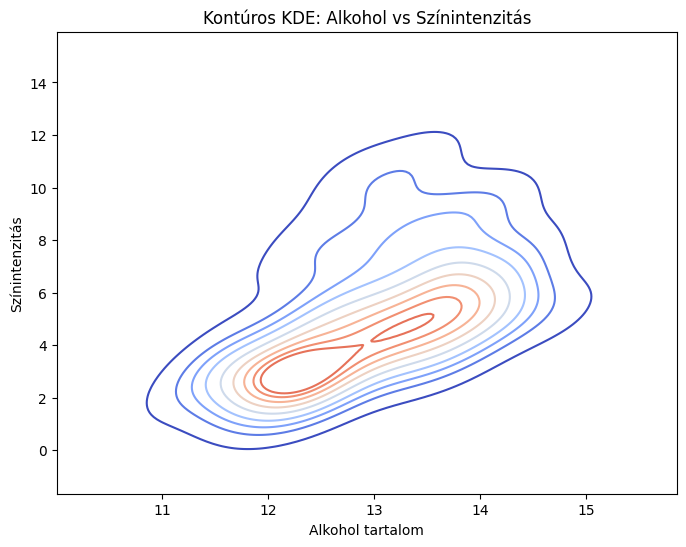

In [71]:
plt.figure(figsize=(8, 6))
sns.kdeplot(x=df["alcohol"], y=df["color_intensity"], cmap="coolwarm", fill=False)
plt.xlabel("Alkohol tartalom")
plt.ylabel("Színintenzitás")
plt.title("Kontúros KDE: Alkohol vs Színintenzitás")
plt.show()


Mit látunk?

- Koncentrált kontúrok -> itt vannak a legnagyobb sűrűségű értékek.
- Minél sűrűbbek a vonalak, annál több adat található azon a területen.
- Ha az eloszlás széles, az azt jelenti, hogy az értékek nagyobb szórást mutatnak.

### Kétváltozós KDE plot borfajtánként (külön ábrák)
Minden borfajtára külön KDE plotot készítünk.

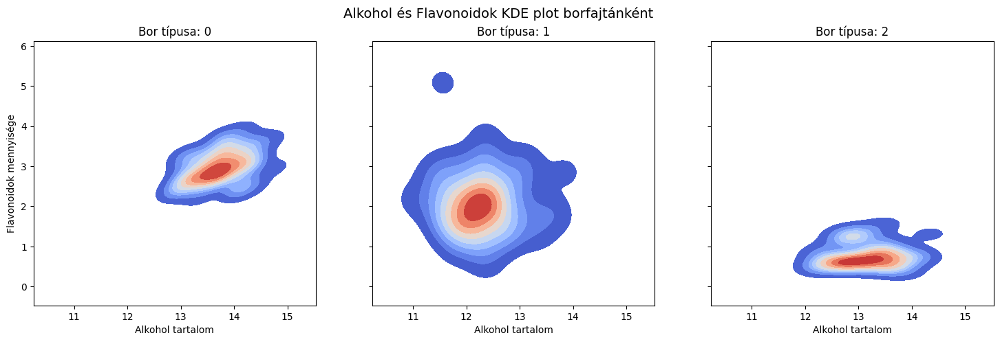

In [74]:
import seaborn as sns
import matplotlib.pyplot as plt

# --- Ábra beállítása ---
# 1 sor, 3 oszlopos alábrák, közös X és Y tengelyek
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharex=True, sharey=True)

# --- Ciklus a borfajtákhoz ---
for i, ax in enumerate(axes):
    # KDE plot készítése az adott borfajta adataiból
    sns.kdeplot(
        x=df[df["target"] == i]["alcohol"],      # X tengely: alkohol tartalom
        y=df[df["target"] == i]["flavanoids"],  # Y tengely: flavonoid mennyiség
        cmap="coolwarm",                         # Színskála a sűrűséghez
        fill=True,                               # Színezett terület a sűrűség alatt
        ax=ax                                    # Az adott subplot-ra rajzoljuk
    )
    # Alábra címe az aktuális borfajtának
    ax.set_title(f"Bor típusa: {i}")
    # Tengelyek feliratai
    ax.set_xlabel("Alkohol tartalom")
    ax.set_ylabel("Flavonoidok mennyisége")

# --- Teljes figura címe ---
plt.suptitle("Alkohol és Flavonoidok KDE plot borfajtánként", fontsize=14)

# --- Ábra megjelenítése ---
plt.show()



Mit látunk?

- Minden borfajtához külön KDE plot tartozik.
- A sűrűbb területek mutatják, hogy az adott borfajta általában milyen alkoholtartalommal és flavonoidtartalommal rendelkezik.
- A KDE segít kiemelni a borfajták közötti különbségeket.

### Kétváltozós KDE plot borfajtánként egyetlen ábrán
Egyetlen KDE ploton jelenítjük meg az összes borfajtát eltérő színekkel.

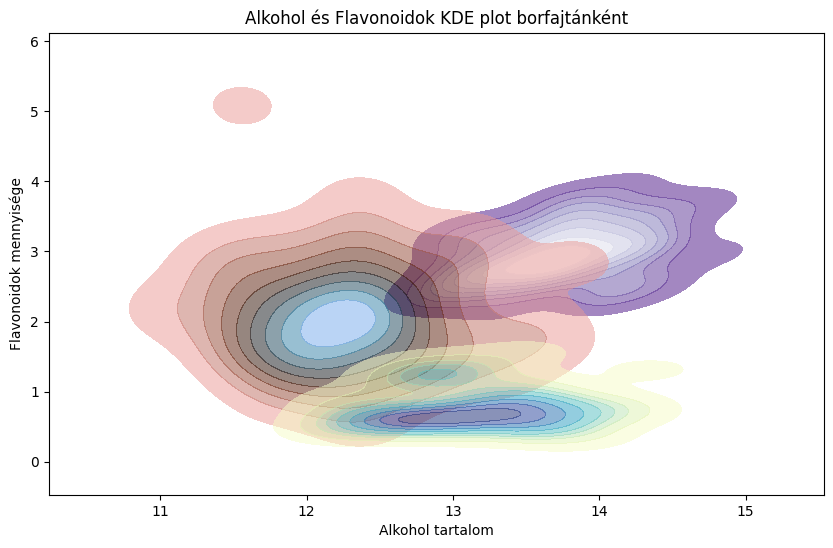

In [77]:
plt.figure(figsize=(10, 6))

# Ciklus borfajtánként
for i, color in zip(range(3), ['Purples_r', 'berlin_r', 'YlGnBu']):
  sns.kdeplot(
        x=df[df["target"] == i]["alcohol"],
        y=df[df["target"] == i]["flavanoids"],
        cmap=color,
        fill=True,
        label=f"Bor típusa {i}",
        alpha=0.5
    )

plt.xlabel("Alkohol tartalom")
plt.ylabel("Flavonoidok mennyisége")
plt.title("Alkohol és Flavonoidok KDE plot borfajtánként")
plt.show()


Mit látunk?

- Az egyes borfajták különböző színekkel jelennek meg.
- A KDE plot sűrűségi területei megmutatják, hogy a borok mely jellemzőkkel rendelkeznek.
- Átfedések is láthatók, ami azt jelenti, hogy bizonyos borfajták flavonoid és alkoholtartalma hasonló lehet.

Miért hasznos ez a KDE vizualizáció?
- Többváltozós eloszlásokat elemezhetünk -> Nem csak egy változóra fókuszálunk.
- Megmutatja, hogy a borfajták mennyire különböznek egymástól -> Elkülönülnek-e vagy átfedésben vannak?
- Segít észlelni mintázatokat és eltéréseket -> Például, ha egy borfajta jellemzően magas flavonoidtartalommal rendelkezik.

Ezzel a KDE plottal gyorsan felismerhetjük az összefüggéseket és eltéréseket a borfajták között!

## Kétváltozós KDE és szórásdiagram kombinációja
A Seaborn jointplot függvénye egy kétváltozós kapcsolatot vizsgál, és egyben mutatja:

- Két változó kapcsolatát szórásdiagramként vagy KDE-ként (középen).
- Mindkét változó egyváltozós eloszlását (a tengelyek mentén hisztogramként vagy KDE plotként).
- Ez egy komplex és informatív vizualizáció, amely segít megérteni a változók kapcsolatát és eloszlását egyszerre.

### Alap jointplot KDE és szórásdiagrammal
Vizsgáljuk az alcohol és flavanoids közötti kapcsolatot!

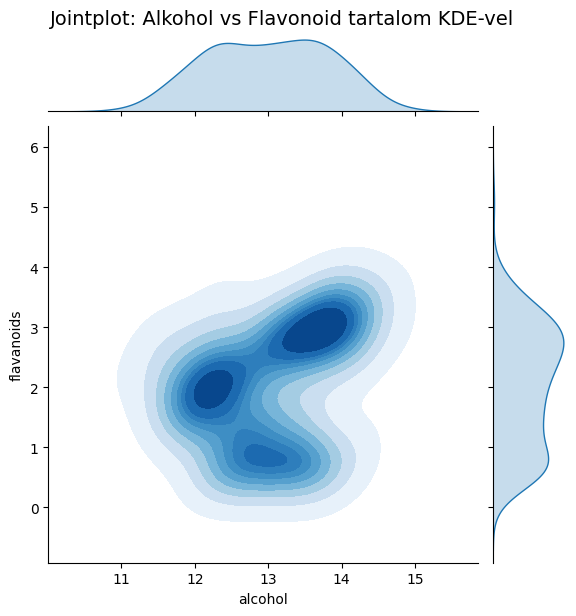

In [82]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.jointplot(
    x="alcohol",
    y="flavanoids",
    data=df,
    kind="kde",   # Kernel Density Estimation (sűrűség)
    fill=True,
    cmap="Blues"
)

plt.suptitle("Jointplot: Alkohol vs Flavonoid tartalom KDE-vel", fontsize=14, y=1.02)
plt.show()


Mit látunk?

- A központi terület mutatja az alkohol és flavonoidok közötti KDE eloszlást.
- A tengelyek mentén lévő KDE plotok megmutatják az egyéni eloszlásokat.
- Ahol legsötétebb a terület, ott a legtöbb adat található, vagyis ott a legnagyobb a sűrűség.

### jointplot scatterplot és KDE kombinációval
Ha az adatok pontjait is látni szeretnénk, a kind="scatter" opcióval kombinálhatjuk a KDE-t!

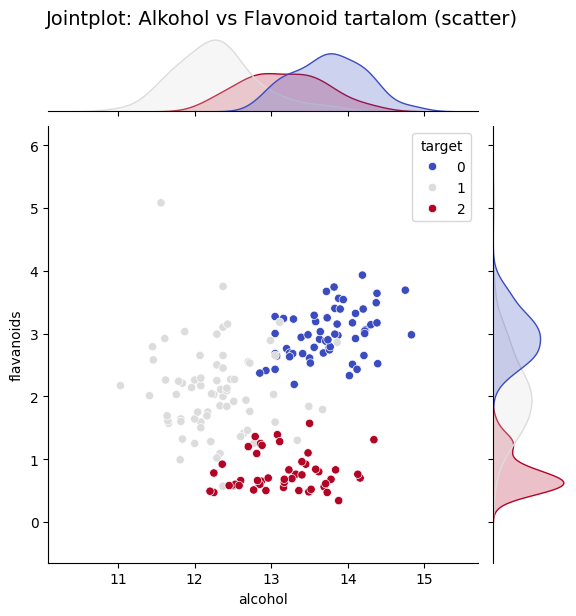

In [85]:
sns.jointplot(
    x="alcohol",
    y="flavanoids",
    data=df,
    kind="scatter",  # Szórásdiagram
    hue="target",    # Bor típusa szerint színezés
    palette="coolwarm"
)

plt.suptitle("Jointplot: Alkohol vs Flavonoid tartalom (scatter)", fontsize=14, y=1.02)
plt.show()


Mit látunk?

- A központi rész szórásdiagram -> minden adatpont egy borkóstolási eredményt jelent.
- A tengelyek mentén KDE hisztogramok mutatják az eloszlást.
- A különböző borfajták különböző színekkel jelennek meg (hue="target"), így összehasonlíthatók.

### jointplot hexbin móddal
Hexbin diagrammal a KDE helyett hatszögletű csoportosítást használunk!

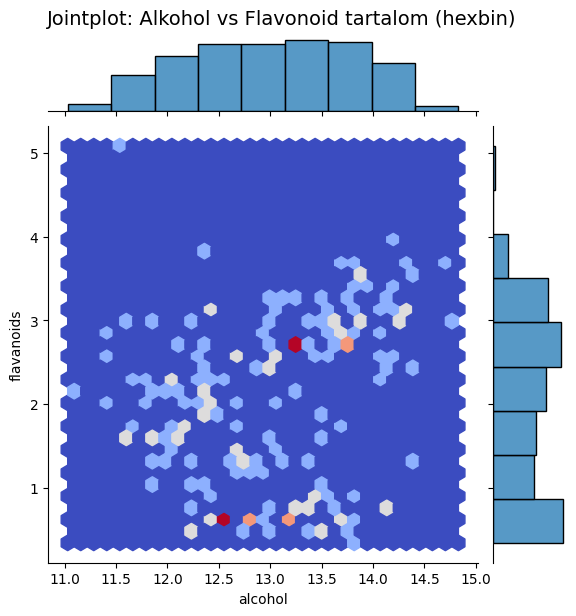

In [88]:
sns.jointplot(
    x="alcohol",
    y="flavanoids",
    data=df,
    kind="hex",  # Hexbin diagram
    gridsize=30,
    cmap="coolwarm"
)

plt.suptitle("Jointplot: Alkohol vs Flavonoid tartalom (hexbin)", fontsize=14, y=1.02)
plt.show()


Mit látunk?

- A középső hatszög alakú csempék mutatják, hol vannak a legnagyobb adatsűrűségek.
- A legsötétebb területek jelentik a leggyakoribb értékkombinációkat.
- Ez egy jó alternatíva a KDE helyett, ha túl sok adatpont van.

### Violin Plot

- A violin plot a boxplot és a kernel sűrűségbecslés (KDE) ötvözete.
- Megmutatja a középértéket, a kvartiliseket (mint a boxplot), ugyanakkor az adatok eloszlásának alakját is (szimmetrikus vagy ferde, unimodális vagy bimodális stb.).
- Előnye, hogy nem csak a „központi tendenciát” látjuk, hanem az egész eloszlás jellegét.


### Violin Plot – Borok alkoholtartalma borfajtánként

Mit mutat?

- Az eloszlást sűrűségként ábrázolja.
- A szélesebb részek mutatják, hogy azon az értéken több adat van.
- Egy boxplot is látható benne (középső vonalak: medián és kvartilisek).

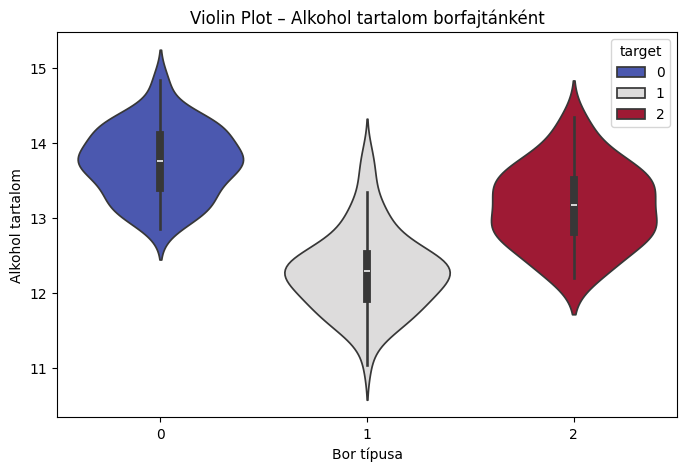

In [92]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
sns.violinplot(x="target", y="alcohol", data=df, hue="target", palette="coolwarm")
plt.xlabel("Bor típusa")
plt.ylabel("Alkohol tartalom")
plt.title("Violin Plot – Alkohol tartalom borfajtánként")
plt.show()


Mit látunk?

- A különböző borfajták alkoholtartalmának eloszlását mutatja.
- Ha egy "hegedű" szélesebb → azon az értéken több adatpont található.
- A középső fekete vonalak a mediánt és kvartiliseket jelölik.
- Ha aszimmetrikus a violinplot, az azt jelzi, hogy az eloszlás ferde.

### Swarmplot

- A swarmplot minden egyes adatpontot kirajzol, de úgy, hogy azonos kategórián belül kissé eltolja őket, nehogy fedjék egymást.
- Ezáltal a minta nagysága, sűrűsége is jól látható.
- Előnye, hogy a valódi adatpontokat látjuk, nem csak összefoglaló statisztikákat vagy simított görbét.

### Swarmplot – Az egyes borok alkoholtartalma borfajtánként

Mit mutat?

- Minden egyes adatpont látható, de egy kicsit eltolva, hogy ne fedjék egymást.
- Valós eloszlás jelenik meg, és látjuk, hány minta tartozik egy adott kategóriához.

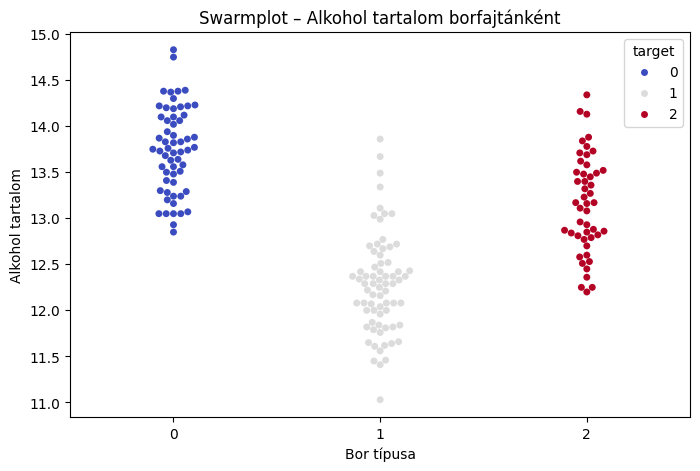

In [96]:
plt.figure(figsize=(8, 5))
sns.swarmplot(x="target", y="alcohol", data=df, hue="target", palette="coolwarm", size=5)
plt.xlabel("Bor típusa")
plt.ylabel("Alkohol tartalom")
plt.title("Swarmplot – Alkohol tartalom borfajtánként")
plt.show()


Mit látunk?

- Minden egyes adatpont egy-egy bor mérése.
- Az adatok elhelyezkedése alapján jobban látható a sűrűség (ahol több adat van, ott a pontok zsúfoltabbak).
- Ha az adatpontok nagyon szétszóródnak, az nagy szórást jelent.

### Violin Plot és Swarmplot kombinálása
A Swarmplot és Violinplot kombinációjával mindkét előnyt kihasználhatjuk!

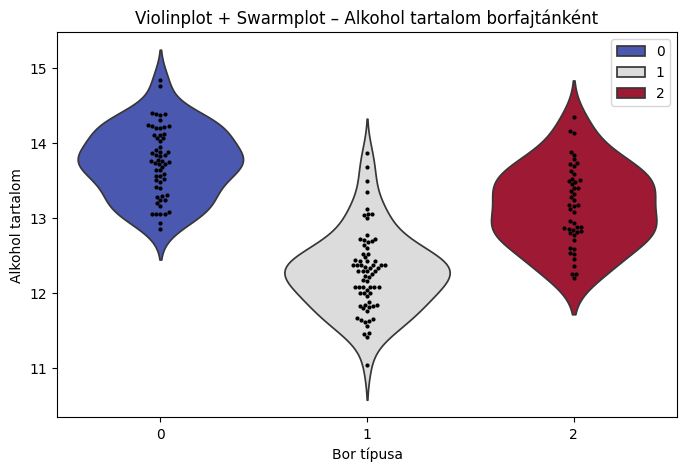

In [99]:
plt.figure(figsize=(8, 5))
sns.violinplot(x="target", y="alcohol", data=df, inner=None, hue="target", palette="coolwarm")  # Violinplot (belső boxplot nélkül)
sns.swarmplot(x="target", y="alcohol", data=df, color="black", size=3)  # Swarmplot ráhelyezve
plt.xlabel("Bor típusa")
plt.ylabel("Alkohol tartalom")
plt.title("Violinplot + Swarmplot – Alkohol tartalom borfajtánként")
plt.show()


Mit látunk?

- A violinplot a teljes eloszlást mutatja, így látjuk az adatok sűrűségét.
- A swarmplot minden adatpontot kirajzol, így a mérések valódi értékei is látszanak.
- Ez egy nagyon informatív ábra, amely mindkét módszer előnyeit kombinálja.

### Párosított Sűrűség- és Szórásdiagram Mátrix (pairplot)

A Paired Density és Scatterplot Matrix (Pairplot) egy nagyszerű vizualizációs eszköz több numerikus változó kapcsolatának és eloszlásának együttes elemzésére.

Mit tartalmaz egy Pairplot?

- Főátlóban KDE vagy Hisztogram -> Az egyes változók saját eloszlását mutatja.
- Alsó háromszögben Szórásdiagram (Scatterplot) -> Két változó közötti kapcsolatot mutatja.
- Színezési lehetőség kategóriák szerint -> Pl. borfajták (target).


## Alap Pairplot (Párosított scatterplot és KDE mátrix)

Vizsgáljuk meg a Wine dataset fontosabb változóit!


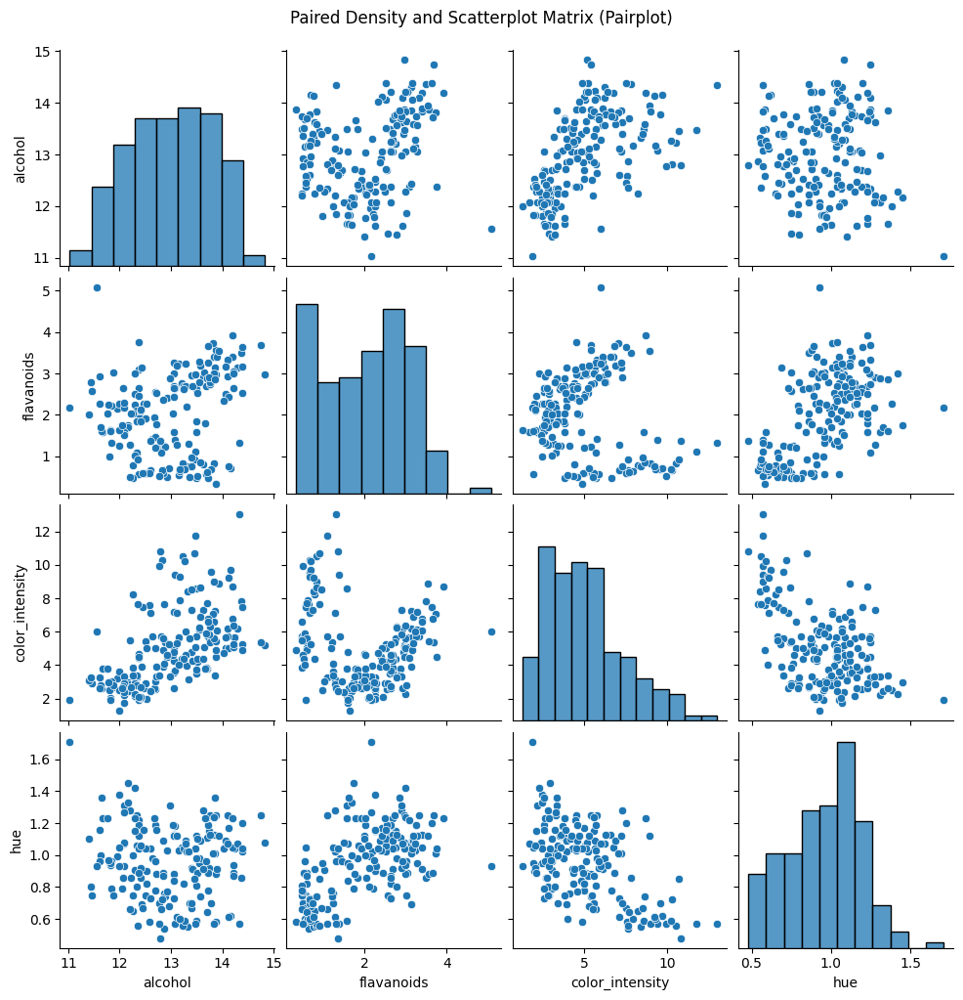

In [103]:
import seaborn as sns
import matplotlib.pyplot as plt

# Kiválasztunk néhány fontosabb változót az elemzéshez
selected_features = ["alcohol", "flavanoids", "color_intensity", "hue"]

# Pairplot készítése
sns.pairplot(df[selected_features])
plt.suptitle("Paired Density and Scatterplot Matrix (Pairplot)", y=1.02)
plt.show()

Mit látunk?

- A főátlóban az egyes változók eloszlásait látjuk (hisztogram vagy KDE plot).
- A mátrix többi részében a változók közötti szórásdiagramokat látjuk.
- Ha két változó erősen korrelál, a pontok egy lineáris mintázatot fognak követni.

### Kategóriák szerinti Pairplot (hue színezéssel)

Most a target alapján színezzük a borfajták szerint!

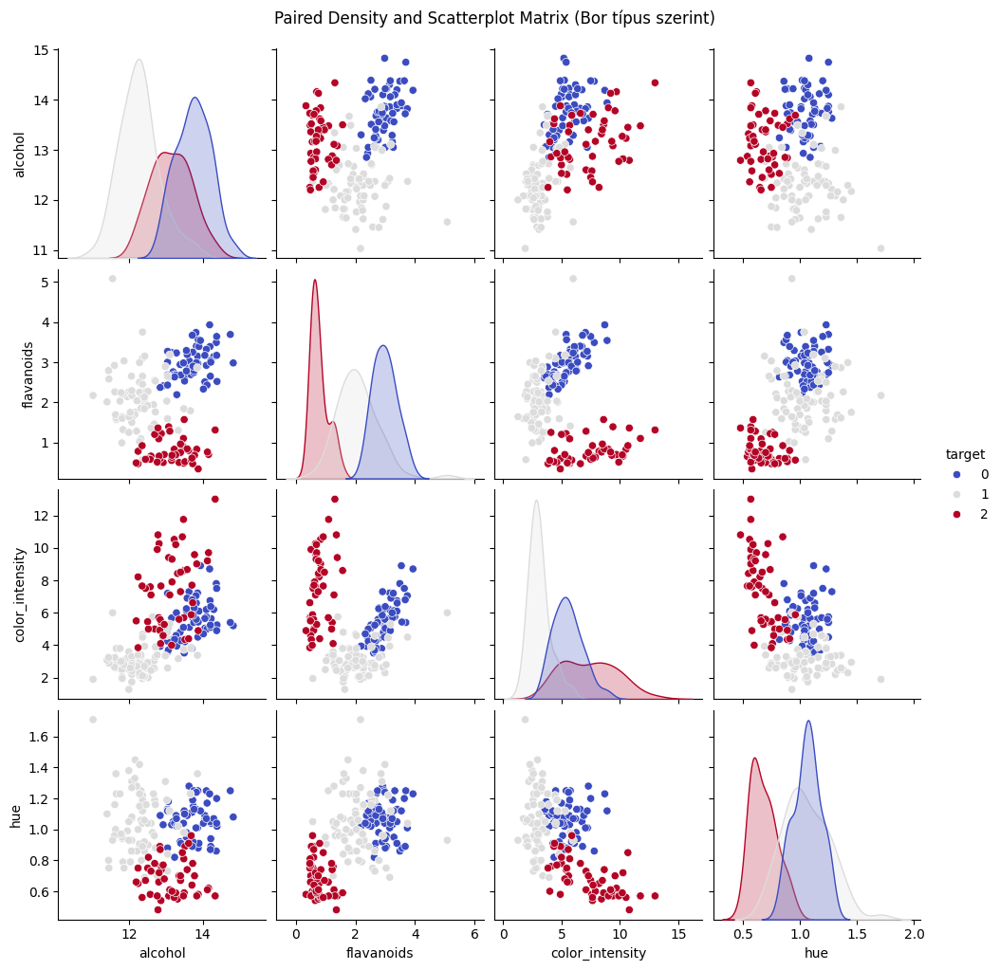

In [106]:
sns.pairplot(df[selected_features + ["target"]], hue="target", palette="coolwarm")
plt.suptitle("Paired Density and Scatterplot Matrix (Bor típus szerint)", y=1.02)
plt.show()


Mit látunk?

- A különböző borfajták eltérő színnel jelennek meg, így könnyen összehasonlíthatók.
- Az átfedések megmutatják, hogy bizonyos változók alapján a borfajták elkülöníthetők-e.
- Például, ha egy osztály egyértelműen elkülönül egy tengely mentén, akkor az a változó fontos lehet az osztályozásban.

### KDE helyett Hisztogram az átlón
Ha a KDE helyett Hisztogramokat szeretnénk az átlóra (diag_kind="hist")

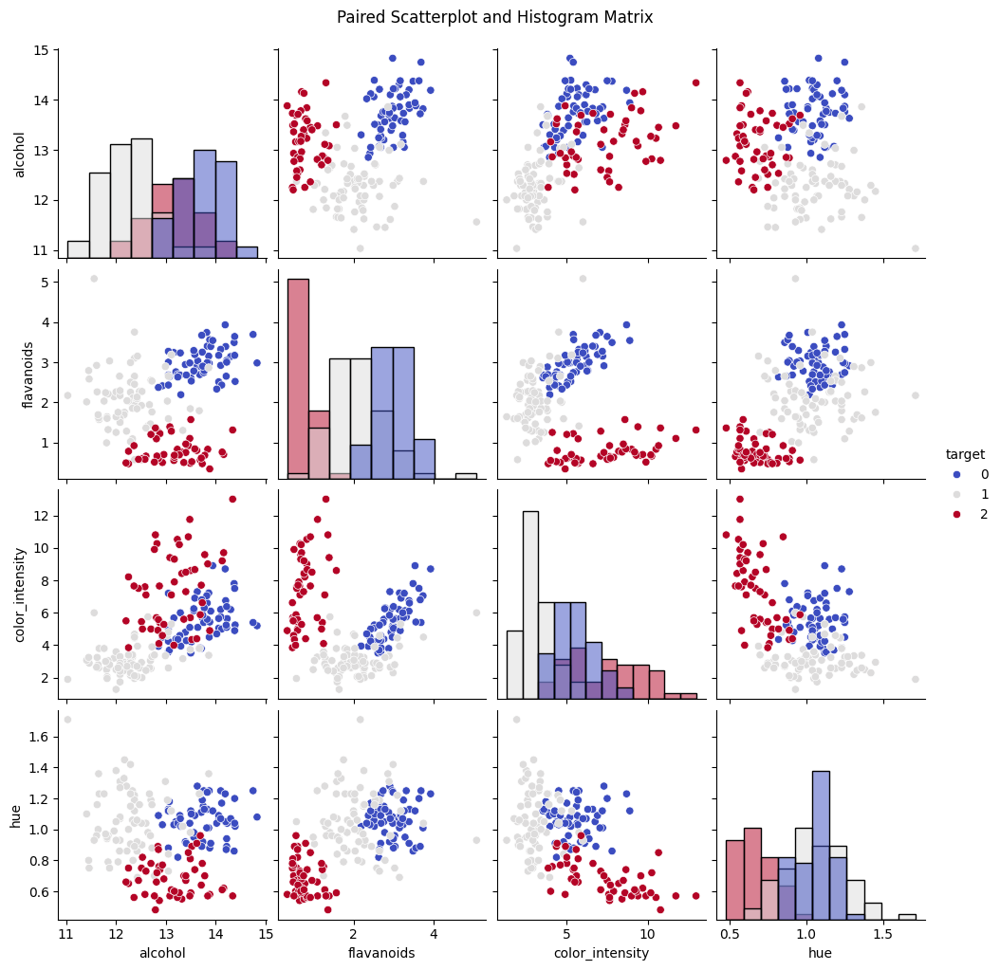

In [109]:
sns.pairplot(df[selected_features + ["target"]], hue="target", diag_kind="hist", palette="coolwarm")
plt.suptitle("Paired Scatterplot and Histogram Matrix", y=1.02)
plt.show()


Mit látunk?

- A főátlóban most hisztogramok jelennek meg, nem KDE plot.
- Könnyebb megszámolni, hogy egy adott tartományban hány minta található.
- Jó alternatíva, ha az adat kevésbé folytonos és egyértelműbb eloszlást keresünk.

### Overlapping Densities – Ridge Plot (Ridgeline Plot)
A Ridge Plot (más néven ridgeline plot) egy egymást átfedő KDE plotok sorozata, amely kategóriák szerinti eloszlásokat mutat.

Ez különösen hasznos, ha több csoportba rendezett numerikus változó eloszlását akarjuk összehasonlítani.

### Ridge Plot – Alkohol eloszlása borfajtánként
Itt az alcohol oszlopot vizsgáljuk a target (borfajta) szerint.

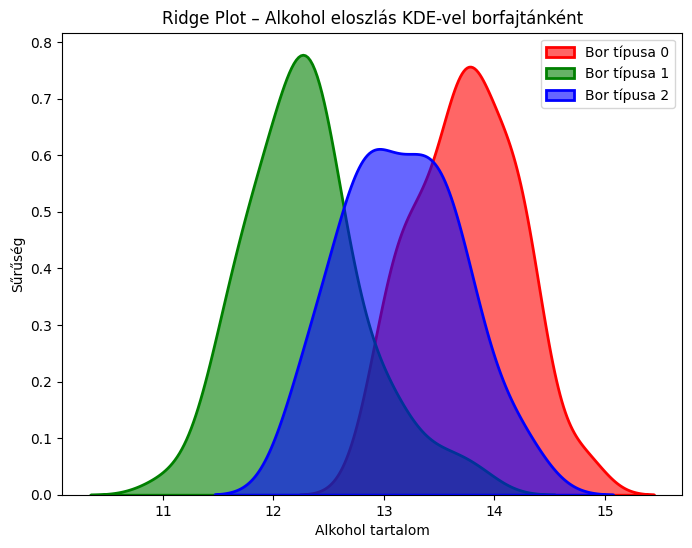

In [113]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

# KDE plot minden borfajtára
for i, color in zip(range(3), ["red", "green", "blue"]):
    sns.kdeplot(
        df[df["target"] == i]["alcohol"],
        fill=True, alpha=0.6, linewidth=2, label=f"Bor típusa {i}", color=color
    )

plt.xlabel("Alkohol tartalom")
plt.ylabel("Sűrűség")
plt.title("Ridge Plot – Alkohol eloszlás KDE-vel borfajtánként")
plt.legend()
plt.show()


### Adateloszlások és normalitás vizsgálata
Sok modell (pl. lineáris regresszió, ANOVA) feltételezi, hogy az adatok normál eloszlásúak.

- Hisztogram vagy KDE plot segítségével ellenőrizhetjük az eloszlást.
- Shapiro-Wilk teszt vagy Kolmogorov-Smirnov teszt statisztikai ellenőrzésre.

In [115]:
from scipy.stats import shapiro

# Normál eloszlás vizsgálata egy változóra
stat, p = shapiro(df["alcohol"])
print(f"Shapiro-Wilk p-érték: {p}")

if p > 0.05:
    print("Az adatok normál eloszlásúak lehetnek.")
else:
    print("Az adatok nem normál eloszlásúak.")


Shapiro-Wilk p-érték: 0.020047981728854945
Az adatok nem normál eloszlásúak.


Miért fontos?

- Ha az adatok nem normálisan oszlanak el, akkor log-transzformáció vagy más átalakítás szükséges lehet.

### Haladó Pandas Műveletek és Vizualizációk a Wine Dataset-en
Most nézzünk néhány haladó Pandas műveletet (pl. groupby, lambda, apply) és ezek vizualizációját a Wine dataset segítségével.

### GroupBy – Átlagos alkoholtartalom borfajtánként (Bar Chart)
Vizsgáljuk meg, hogy a különböző borfajták átlagos alkoholtartalma hogyan alakul.

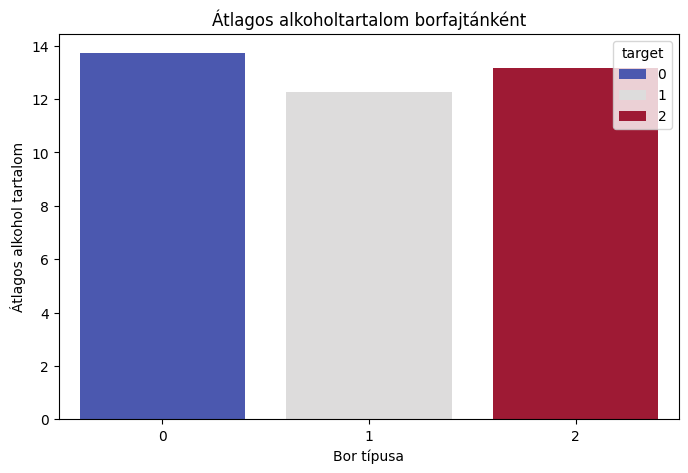

In [119]:
import seaborn as sns
import matplotlib.pyplot as plt

# Csoportosítás borfajta szerint és átlagos alkoholtartalom kiszámítása
alcohol_mean = df.groupby("target")["alcohol"].mean()

# Oszlopdiagram rajzolása
plt.figure(figsize=(8, 5))
sns.barplot(x=alcohol_mean.index, y=alcohol_mean.values, hue=alcohol_mean.index, palette="coolwarm")
plt.xlabel("Bor típusa")
plt.ylabel("Átlagos alkohol tartalom")
plt.title("Átlagos alkoholtartalom borfajtánként")
plt.show()


Mit látunk?

- A különböző borfajták eltérő alkoholtartalommal rendelkeznek.
- Ha egy borfajta jelentősen eltérő átlaggal rendelkezik, akkor az egy fontos megkülönböztető tényező lehet.

### GroupBy + Lambda – Borok osztályozása alkohol szint szerint
Kategorizáljuk a borokat a lambda függvény segítségével, majd ábrázoljuk őket.

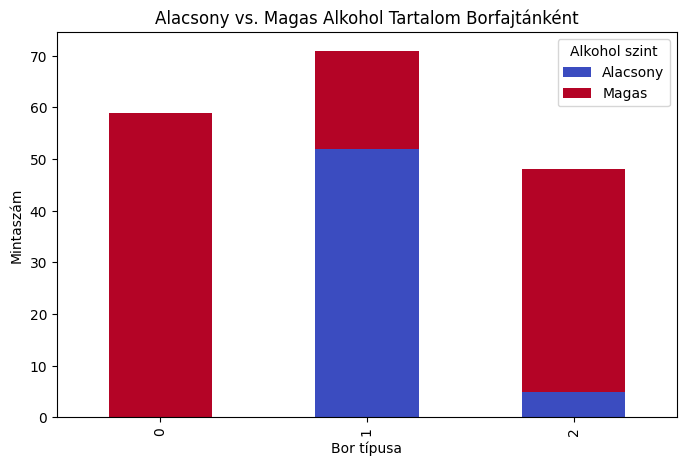

In [122]:
# Alkohol szint kategorizálása
df["alcohol_level"] = df["alcohol"].apply(lambda x: "Alacsony" if x < 12.5 else "Magas")

# Kereszttábla készítése 
alcohol_counts = pd.crosstab(df["target"], df["alcohol_level"])

# Oszlopdiagram rajzolása beépitett PANDAS függvénnyel
alcohol_counts.plot(kind="bar", stacked=True, figsize=(8, 5), colormap="coolwarm")

plt.xlabel("Bor típusa")
plt.ylabel("Mintaszám")
plt.title("Alacsony vs. Magas Alkohol Tartalom Borfajtánként")
plt.legend(title="Alkohol szint")
plt.show()


Mit látunk?

- A borfajták eltérő arányban tartalmaznak alacsony vagy magas alkoholtartalmú borokat.
- Ez segíthet a borok besorolásában és megkülönböztetésében.

### GroupBy + Aggregation – Több statisztika egy lépésben
Nézzük meg az alkoholtartalom és a színintenzitás átlagát és szórását borfajtánként.

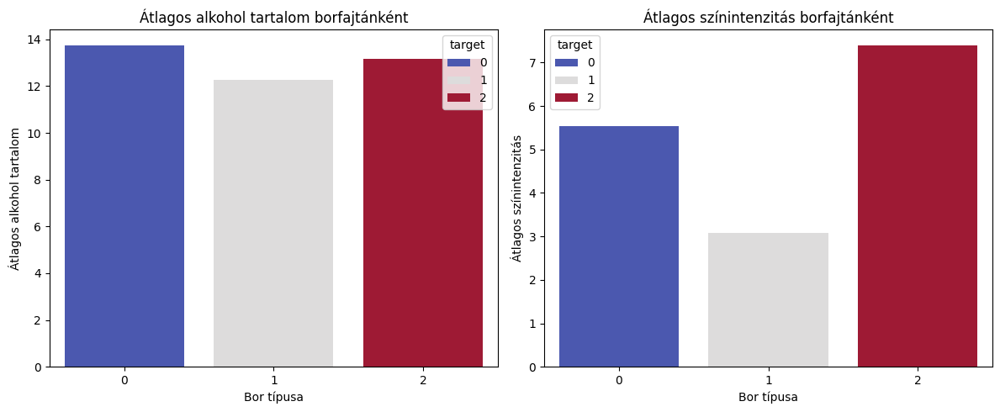

In [125]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import load_wine

# Wine dataset betöltése
wine = load_wine()
df = pd.DataFrame(wine.data, columns=wine.feature_names)
df["target"] = wine.target  # Borfajta hozzárendelése

# Több statisztikai mutató kiszámítása egyszerre
stats = df.groupby("target").agg(
    avg_alcohol=("alcohol", "mean"),
    std_alcohol=("alcohol", "std"),
    avg_color_intensity=("color_intensity", "mean"),
    std_color_intensity=("color_intensity", "std"),
)

# Táblázatos megjelenítés
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Átlagos alkoholtartalom vizualizálása
sns.barplot(x=stats.index, y=stats["avg_alcohol"], ax=axes[0], hue=stats.index, palette="coolwarm")
axes[0].set_title("Átlagos alkohol tartalom borfajtánként")
axes[0].set_xlabel("Bor típusa")
axes[0].set_ylabel("Átlagos alkohol tartalom")

# Átlagos színintenzitás vizualizálása
sns.barplot(x=stats.index, y=stats["avg_color_intensity"], ax=axes[1], hue=stats.index, palette="coolwarm")
axes[1].set_title("Átlagos színintenzitás borfajtánként")
axes[1].set_xlabel("Bor típusa")
axes[1].set_ylabel("Átlagos színintenzitás")

plt.tight_layout()
plt.show()




### Apply + Lambda – Új oszlop létrehozása flavonoidok alapján
 Megnézzük, hogy a flavonoidok értéke szerint milyen kategóriákba esnek a borok.

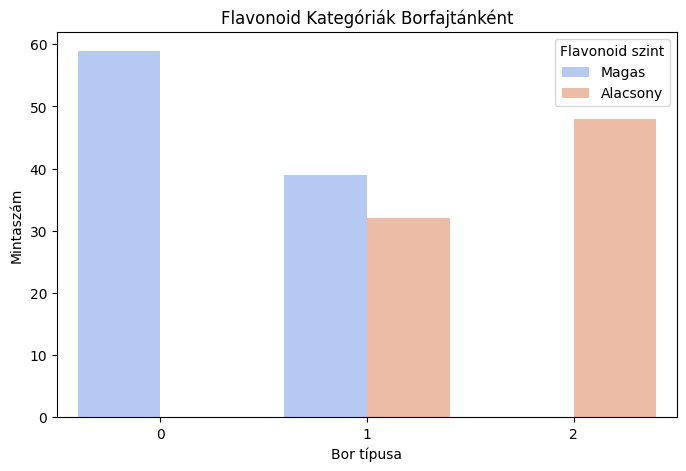

In [127]:
# Új kategória létrehozása flavonoid szint alapján
df["flavonoid_category"] = df["flavanoids"].apply(lambda x: "Alacsony" if x < 2 else "Magas")

# Kategóriák vizualizálása borfajtánként
plt.figure(figsize=(8, 5))
sns.countplot(x="target", hue="flavonoid_category", data=df, palette="coolwarm")
plt.xlabel("Bor típusa")
plt.ylabel("Mintaszám")
plt.title("Flavonoid Kategóriák Borfajtánként")
plt.legend(title="Flavonoid szint")
plt.show()


Mit látunk?

- Az egyes borfajtákban az alacsony és magas flavonoidtartalmú borok eloszlása eltérhet.
- Ez egy új osztályozási szempont lehet a borok vizsgálatában.

### Pivot Table + Heatmap – Átlagos fenoltartalom és színintenzitás kapcsolata

Egy hőtérkép segítségével vizsgáljuk meg az átlagos fenoltartalmat és színintenzitást borfajtánként.

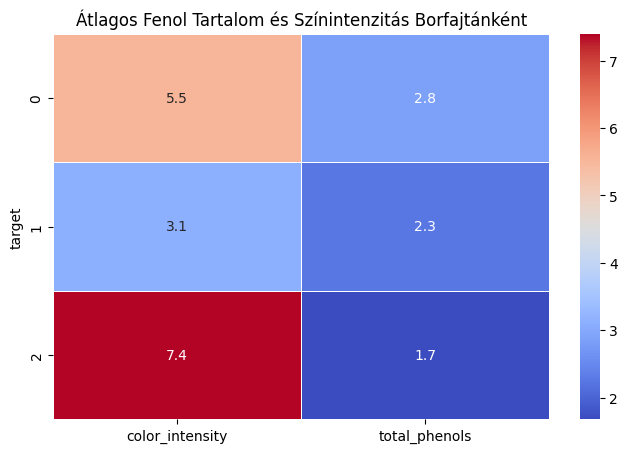

In [130]:
# Pivot tábla készítése
pivot_table = df.pivot_table(index="target", values=["total_phenols", "color_intensity"], aggfunc="mean")

# Hőtérkép megjelenítése
plt.figure(figsize=(8, 5))
sns.heatmap(pivot_table, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Átlagos Fenol Tartalom és Színintenzitás Borfajtánként")
plt.show()


Mit látunk?

- A hőtérkép segít összehasonlítani a borfajták eltérő fenoltartalmát és színintenzitását.
- Ez az elemzés hasznos lehet a borok osztályozására és szűrésére.

### Mi a Pivot Table a Pandas-ban?

A Pivot Table egy olyan eszköz a Pandas könyvtárban, amely lehetővé teszi az adatok csoportosítását, összegzését és átalakítását egy táblázatos formátumban.

Nagyon hasonló az Excel Pivot Táblájához, és segít rugalmas statisztikai elemzések elvégzésében.

Hogyan működik egy Pivot Table?
Főbb elemek:

- Index (index) – Az az oszlop, amely szerint csoportosítunk.
- Oszlopok (columns) – Opcionálisan egy másik kategória szerint bontjuk az adatokat.
- Értékek (values) – Az a numerikus oszlop, amelyet összegzünk (pl. átlag, összeg, szórás).
 -Függvény (aggfunc) – Az aggregáló függvény (pl. mean, sum, count, std).


#### Alap Pivot Table példa – Átlagos alkoholtartalom borfajtánként

Ebben a példában kiszámítjuk az egyes borfajták átlagos alkoholtartalmát.

In [135]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import load_wine

# Wine dataset betöltése
wine = load_wine()
df = pd.DataFrame(wine.data, columns=wine.feature_names)
df["target"] = wine.target  # Borfajta hozzárendelése

# Pivot table létrehozása
pivot_table = df.pivot_table(index="target", values="alcohol", aggfunc="mean")

# Táblázat kiírása
print(pivot_table)


          alcohol
target           
0       13.744746
1       12.278732
2       13.153750


Mit csinálunk?

- Csoportosítjuk az adatokat a target (bor típusa) alapján.
- Az alcohol oszlop átlagát számoljuk ki az egyes borfajtákra.

### Több oszlop használata a Pivot Table-ben

Átlagos alkoholtartalom és színintenzitás borfajtánként.

In [138]:
pivot_table = df.pivot_table(index="target", values=["alcohol", "color_intensity"], aggfunc="mean")
print(pivot_table)


          alcohol  color_intensity
target                            
0       13.744746         5.528305
1       12.278732         3.086620
2       13.153750         7.396250


Mit látunk?

- Egyszerre több numerikus oszlop aggregálását végezzük el.
- Minden borfajtára látjuk az alkoholtartalom és a színintenzitás átlagát.

### Több aggregáló függvény használata
Átlag és szórás kiszámítása az alkoholtartalomra borfajtánként.

In [141]:
pivot_table = df.pivot_table(index="target", values="alcohol", aggfunc=["mean", "std"])
print(pivot_table)


             mean       std
          alcohol   alcohol
target                     
0       13.744746  0.462125
1       12.278732  0.537964
2       13.153750  0.530241


Mit csinálunk?

- Egyszerre több statisztikai mutatót is kiszámolunk (mean, std).
- Az eredmény egy összefoglaló táblázat lesz.